# Modelling and EDA
In this notebook we discuss in detail the modelling and exploratory data analysis of the project. As explained in the "Readme", the modelling aspect of this project entails a classification problem. It attempts to segment 30 second audio clips from police radio broadcasts into "emergency" and "non-emergency", based on the audio features we can extract from the clip.

**Table of contents:**
- [Notebook set up](#section_1)
- [Audio Features extracted using Librosa](#section_2)
- [Building the model](#section_3)
- [Analyzing Feature importances](#section_4)
- [Visual the differences between two classes](#section_5)

## Notebook setup <a id="section_1"></a>
In this section we import the libraries needed to run this Jupyter notebook and we read the dataframe created on the "Gathering Data" notebook of this repository. 

Note - Due to size imits in github we have saved the dataframe as a zip file, in order for the reader to succesfully execute the code below, the reader requieres to unzip such file or create the dataframe from scratch following the steps outlined on the "Gathering Data" notebook. 

In [16]:
#Import relevant libraries
import pandas as pd
import numpy as np
import librosa
import librosa.display

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import seaborn as sns

import IPython.display as ipd

%matplotlib inline

In [17]:
# Read dataframe
df = pd.read_csv('df_master_audioandspeech_clean.csv')

We will display the first 5 rows of the dataframe for illustrative purposes.

In [18]:
# Show first 5 rows
df.head()

,Unnamed: 0,file_name,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,...,spectral_contrast_3,spectral_contrast_4,spectral_contrast_5,spectral_contrast_6,spectral_contrast_7,class,emergency_type,origin,good_exception,audio_recognition
0,0,/home/ubuntu/audio_files/Neal Manahan - negati...,-271.385280,92.355813,-30.058499,2.689378,-1.229074,-19.058415,-5.691040,-5.087986,...,16.919176,18.779119,22.398046,31.679073,17.671396,negative,no emergency,original_files,Exception,NaN
1,1,/home/ubuntu/audio_files/Neal Manahan - negati...,-253.066398,119.268300,-20.202805,5.646021,1.903759,-25.944642,-15.383986,-10.842429,...,18.746517,18.774557,23.149998,32.683987,17.505135,negative,no emergency,original_files,Exception,NaN
2,2,/home/ubuntu/audio_files/Neal Manahan - negati...,-292.069791,105.509819,-15.685743,4.557043,4.672646,-16.334372,-10.919923,-11.202115,...,17.509650,18.696596,23.630680,31.704788,18.035527,negative,no emergency,original_files,Exception,NaN
3,3,/home/ubuntu/audio_files/Neal Manahan - negati...,-276.315390,111.268811,-11.428515,-2.625452,-0.089519,-15.273371,-13.402731,-12.556840,...,17.423585,18.375025,22.876541,30.309931,17.810306,negative,no emergency,original_files,Exception,NaN
4,4,/home/ubuntu/audio_files/Neal Manahan - negati...,-216.353688,114.280287,-121.566734,-31.244276,5.465958,-40.683965,-16.925955,-4.329430,...,16.186528,16.057709,22.536312,40.053492,17.660092,negative,no emergency,original_files,Exception,NaN


We re-organized the dataframe for modeling purposes.

In [19]:
# Change the order of the columns
cols = df.columns.tolist()
cols = cols[-5:] + cols[:-5]
df = df[cols]

# Drop 'Unnamed: 0' column
df.drop(columns='Unnamed: 0', inplace=True)

## Audio features extracted using Librosa <a id="section_2"></a>
In this section we provide a detailed overview of the nature of each feature that was extracted from librosa and used in the model (see code below). We believe this overview is comprenhensive enough for the scope of this project, nevetheless it is not all inclusive. If the reader wills to dig deeper into the understanding of these features we recommend to consult the official __[librosa documentation](https://librosa.github.io/librosa/)__ for additional detail.


### Overview
We used a number of features derived from the audio analysis library, Librosa, in order to train and test our model. Librosa made it possible to pull in our audio clips to a Jupyter notebook and digitally process the audio signal and visualize the features.
The largest indicators of classes were drived from the audio frequency spectrum. The audio spectrum is the audible frequency range at which humans can hear. The audio spectrum range spans from 20 Hz to 20,000 Hz. This can be represented on a spectrogram - shown below.
#### Chroma Feature / Chromagram
In music, the term chroma feature or chromagram closely relates to the twelve different pitch classes. Chroma-based features, which are also referred to as "pitch class profiles", are a powerful tool for analyzing music whose pitches can be meaningfully categorized (often into twelve categories) and whose tuning approximates to the equal-tempered scale. One main property of chroma features is that they capture harmonic and melodic characteristics of music, while being robust to changes in timbre and instrumentation.
The underyling observation is that humans perceive two musical pitches as similar in color if they differ by an octave. Based on this observation, a pitch can be separated into two components, which are referred to as tone height and chroma. Assuming the equal-tempered scale, one considers twelve chroma values represented by the set:
{C, C♯, D, D♯, E ,F, F♯, G, G♯, A, A♯, B}
A chromagram visualizes the twelve pitch class profiles, and captures the harmonic and melodic characteristics of a sound while adapting to changes in timbre (color) of a sound (I.e same pitches in different voices)
(source: https://en.wikipedia.org/wiki/Chroma_feature)
#### Mel Scale and Mel Frequency Cepstrum
Mel Scale interprets how an individual perceives the pitch of a sound.
Mel-frequency cepstral coefficients (MFCCs) are coefficients that collectively make up an MFC. They are derived from a type of cepstral representation of the audio clip (a nonlinear "spectrum-of-a-spectrum"). The difference between the cepstrum and the mel-frequency cepstrum is that in the MFC, the frequency bands are equally spaced on the mel scale, which approximates the human auditory system's response more closely than the linearly-spaced frequency bands used in the normal cepstrum. This frequency warping can allow for better representation of sound, for example, in audio compression.
(source: https://en.wikipedia.org/wiki/Mel-frequency_cepstrum)
#### Tempogram
Tempogram, a mid-level representation of tempo information, is constructed to characterize tempo variation and local pulse in the audio signal. 
(source: "On the use of the tempogram to describe audio content and its application to Music structural segmentation.", https://ieeexplore.ieee.org/document/7178003)
#### Spectral Contrast
Octave-based Spectral Contrast feature considers the strength of spectral peaks and spectral valleys in each sub-band separately.
(source: "Music type classification by spectral contrast feature.", https://ieeexplore.ieee.org/document/1035731
#### Spectral Centroid
The spectral centroid is a measure used in digital signal processing to characterise a spectrum. It indicates where the "center of mass" of the spectrum is located. Perceptually, it has a robust connection with the impression of "brightness" of a sound.
(source: https://en.wikipedia.org/wiki/Spectral_centroid)
#### Spectral Bandwidth
Bandwidth is the difference between the upper and lower frequencies in a continuous band of frequencies.
(source: https://en.wikipedia.org/wiki/Bandwidth_(signal_processing))
#### Spectral Flatness 
Spectral flatness is a measure used to characterize an audio spectrum. Spectral flatness is typically measured in decibels, and provides a way to quantify how noise-like a sound is, as opposed to being tone-like.
(source: https://en.wikipedia.org/wiki/Spectral_flatness)
#### Tonnetz
Computes tonal centroid features.
In musical tuning and harmony, the Tonnetz is a conceptual lattice diagram representing tonal space first described by Leonhard Euler in 1739. Various visual representations of the Tonnetz can be used to show traditional harmonic relationships
(source: https://en.wikipedia.org/wiki/Tonnetz)

## Building The Model <a id="section_3"></a>
**Overview:**
In this section we walk through the model building process. We decided to start our test on a Logistic Regression as a baseline model due to its relative simplicity. Then, we fit a random forest model and compare its performance with the logistic regression. 

During the course of this project we ran multiple models, including simple decision trees, adaboost, extra trees, etc. Overall, all models yielded a similar level of accuracy on the train and test data, as well as on cross validation. Hence, we decided to display logistic regression and random forest in this notebook due to the attributes of these models for "feature importance" exploration. 

As we will see in the next section, feature importance became relevant for our project given the exploratory data analysis that goes with it. It provides evidence to support the model's consistency and robustness. It also allows us to visually make these arguments and show how conceptually the most relevant features in the classification models provide a reasonable split/division of classes. 

**Modelling:**
Data was split into train test split with the features audio features extracted above. The data was then scaled and put through the logistic regression and random forest models.

In [20]:
# Assign X to features and y to 'class' column
X = df.drop(columns=['class', 'emergency_type', 'origin', 'good_exception', 'audio_recognition', 'file_name'])
y = df['class']

# Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=42)

# Standardize the features for Logistic Regression
ss = StandardScaler()

Xs_train = ss.fit_transform(X_train)
Xs_test = ss.transform(X_test)

#### Logistic Regression

In [21]:
# Instantiate
log_reg = LogisticRegression()

# Fit the model
log_reg.fit(Xs_train, y_train)

# Print the scores
print('Accuracy score of Logistic Regression on train set: {:.2f}%'.format(log_reg.score(Xs_train, y_train) * 100))
print('Accuracy score of Logistic Regression on test set: {:.2f}%'.format(log_reg.score(Xs_test, y_test) * 100))

C:\Users\roflo\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Accuracy score of Logistic Regression on train set: 99.91%
Accuracy score of Logistic Regression on test set: 97.71%


We were not expecting to see such a high accuracy in this basic model. We did see some slight overfitting and decided to investigate further with a Random Forest model.

#### Random Forest

In [22]:
# Instantiate
rf = RandomForestClassifier(random_state=42)

# Fit the model
rf.fit(X_train, y_train)

# Print the scores
print('Accuracy score of Random Forest on train set: {:.2f}%'.format(rf.score(X_train, y_train) * 100))
print('Accuracy score of Random Forest on test set: {:.2f}%'.format(rf.score(X_test, y_test) * 100))

C:\Users\roflo\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Accuracy score of Random Forest on train set: 99.97%
Accuracy score of Random Forest on test set: 98.72%


Without any tuning, we saw improvements on our accuracy and reduced the variance between our train and test set.

We made the decision to present this as our final model without optimizing for better sensitivy or specificity. The reason behind this relates to the way the model was trained, the data used for the training and the theoretical functionality of the model on deployment. 

Basically, we trained the model with clips of 30 seconds of audio. These clips were extracted from a larger audio file related to emergencies and "non" emergencies. Given that the larger audio files for emergencies contain several clips with portions of the audio that could reasonably be considered as "non" emergencies, we believe that missclassification is normal and expected, even desireable in such cases (for example, at the begining of the emergency chatter might be low, not a lot of distress percieved on the voices of the police officers, no sirens, even prolongued periods of silence. We would like this to actually be classified as "non" emergency - For additional reference please refer to the "Proof of concept" notebook). 

Below we investigate the incorrect predictions to briefly address the point mentioned above (for an additional discussion with unseen data please refer to the "Proof of concept" notebook). We use a confusion matrix and add a column to our existing data frame to list individual predictions and highlight audio clips of interest.

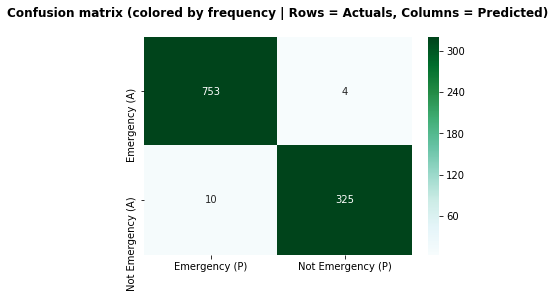

In [32]:
# Plot the confusion matrix
preds = rf.predict(X_test)

conf_matrix_result = confusion_matrix(y_test, preds) # assign confusion matrix

df_cm = pd.DataFrame(conf_matrix_result, # array to create a dataframe from 
                     index = ['Emergency (A)', 'Not Emergency (A)'],   # y-labels
                     columns = ['Emergency (P)', 'Not Emergency (P)']) # x-labels

plt.figure(figsize = (6, 4))

sns.heatmap(df_cm,       # plot heat map from
            annot=True,  # include annotations
            cmap='BuGn', # heatmap color
            fmt='.3g',
            vmax=320)   # show max 3 digits 


plt.savefig('confusion_matrix.svg')
plt.title('Confusion matrix (colored by frequency | Rows = Actuals, Columns = Predicted)',pad=20,weight='bold');# save figure

As seen in the confusion matrix there are very few missclasified clips. We will explore some of them below.

In [14]:
# Create a new column out of model's predictions
# to find missclassified files
df['preds'] = pd.Series(rf.predict(X))
df[df['preds'] != df['class']][['preds', 'class', 'file_name']]

,preds,class,file_name
1844,negative,positive,/home/ubuntu/audio_files/Rodolfo Flores Mendez...
2092,negative,positive,/home/ubuntu/audio_files/Rodolfo Flores Mendez...
2130,negative,positive,/home/ubuntu/audio_files/Rodolfo Flores Mendez...
2179,negative,positive,/home/ubuntu/audio_files/Rodolfo Flores Mendez...
2567,negative,positive,/home/ubuntu/audio_files/positive_columbia_mal...
2602,negative,positive,/home/ubuntu/audio_files/positive_columbia_mal...
2778,negative,positive,/home/ubuntu/audio_files/positive_vegas_-01.wav
2781,negative,positive,/home/ubuntu/audio_files/positive_vegas_-04.wav
2817,negative,positive,/home/ubuntu/audio_files/positive_vegas_-19.wav
2827,negative,positive,/home/ubuntu/audio_files/positive_vegas_-29.wav


In [33]:
# False Positive
ipd.Audio('./test/Neal Manahan - negative_pittsburg_1_-09.wav')

As heard above, this clip has a big portion of silence which could have been the reason for it being missclassified. This could potentially occur on real deployment, which seems normal and expected.

In [35]:
# False Negative
ipd.Audio('./test/Rodolfo Flores Mendez - positive_explosion_1_-19.wav')

This is an emergency that was not classified correctly. Based on the audio it should have been marked as an emergency. Potentially with good speech recognition APIs the model could incorporate text into the features and flag this situations as well. (see Readme "Next steps" section for a detailed commentary on areas of improvement and next steps).

## Analyzing Feature Importances

As we investigated feature importance, we noticed the prevalence of tone and pitch-based features having a high level of importance. According to a 1996 study published in the Journal of Personality and Social Psychology, there is a strong correlation between pitches registering in the mid frequency range for emotions described as Panic, Anxiety, and Despair around 1k - 1.6k Hz, as well as above 6k HZ in the Brilliance range. As we analyzed our data, we saw that these areas played a large part in our model determining the classification of an audio sample. 
(source: https://pdfs.semanticscholar.org/94ef/3dcacea9c1d1a032d7d724bd4b09cae13f7f.pdf)

Looking at our emergency clips on the chromagram, we see there is a large amount of power (amplitude/volume) in the pitch classes that corresponds to the D, D#, E, and F notes. When we relate this back to corresponding frequencies, we see that these pitches are all in the mid range sub-band mentioned above: 
- $D_{6}$ = 1174.66 Hz 
- $E_{6}$ = 1318.51 Hz 
- $F_{6}$ = 1396.91 Hz

(A full breakdown of frequencies on even-tempered scale: http://pages.mtu.edu/~suits/notefreqs.html )

The same can be seen as we look at the higher numbered bins of the MFCC that correspond to the frequencies in the brillance range of the frequency spectrum (MFCC_20, MFCC_22, MFCC_23, MFCC_26.

(source: https://www.teachmeaudio.com/mixing/techniques/audio-spectrum/ )

## Visual representation of differences between two classes

Below we created visualizations that represent examples of features for both an emergency audio clip and a non-emergency audio clip. The audio for both was imported for reference.

In [64]:
# Download the audio files
files = ['./test/Not Emergency.wav','./test/Mass Shooting.wav'] # set the path to audio files

# Create an empty list
raw_sounds = []

# Labels
labels = ['Not Emergency', 'Mass Shooting']

# Extract values from the audio files
# y ---> audio time series
# sr ---> sample rate of y
for file in files: 
    y, sr = librosa.load(file)
    raw_sounds.append(y)

In [37]:
# Audio clip (not emergency)
ipd.Audio('./test/Not Emergency.wav')

In [62]:
# Audio clip (mass shooting)
ipd.Audio('./test/Mass Shooting.wav')

In [65]:
# Plot chromagram from a waveform, melspectogram and spectral bandwidth

def plot_chroma(y, cl):
    chromagram = librosa.feature.chroma_stft(y, sr=sr)
    plt.figure(figsize=(11, 6))
    librosa.display.specshow(chromagram, 
                             x_axis='time', 
                             y_axis='chroma', 
                             cmap='coolwarm')
    plt.title(f'Chroma ({cl})')
    plt.tight_layout()
    plt.savefig(f'{cl}_croma.svg')

def plot_melspect(y, cl):
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)

    plt.figure(figsize=(12, 6))
    librosa.display.specshow(librosa.power_to_db(S, ref=np.max),
                             y_axis='mel', fmax=8000, x_axis='time')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram ({cl})')
    plt.tight_layout()
    plt.savefig(f'{cl}_melspect.svg')
    
def plot_log_spect(y, cl):
    spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)

    S, phase = librosa.magphase(librosa.stft(y=y))
    if_gram, D = librosa.ifgram(y)

    plt.figure(figsize=(11, 6))
    librosa.display.specshow(librosa.amplitude_to_db(S, ref=np.max), 
                             y_axis='log', x_axis='time')
    plt.title(f'log Power Spectrogram ({cl})')
    plt.tight_layout()
    plt.savefig(f'{cl}_spect.svg')

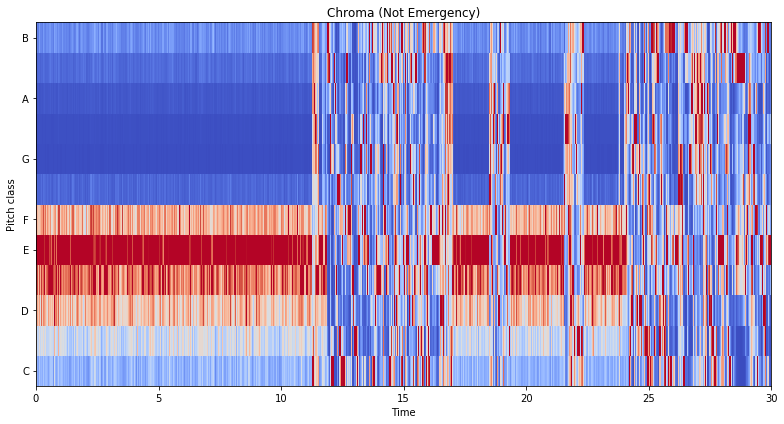

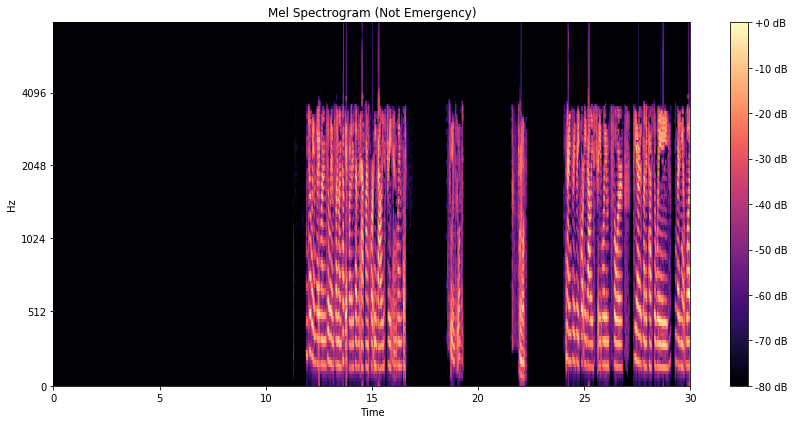

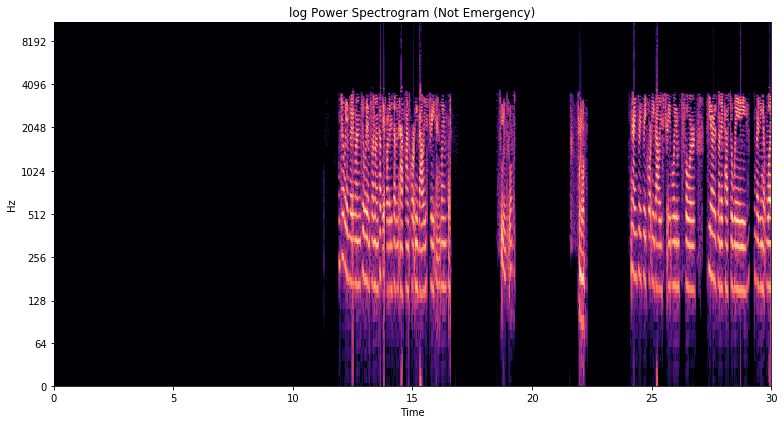

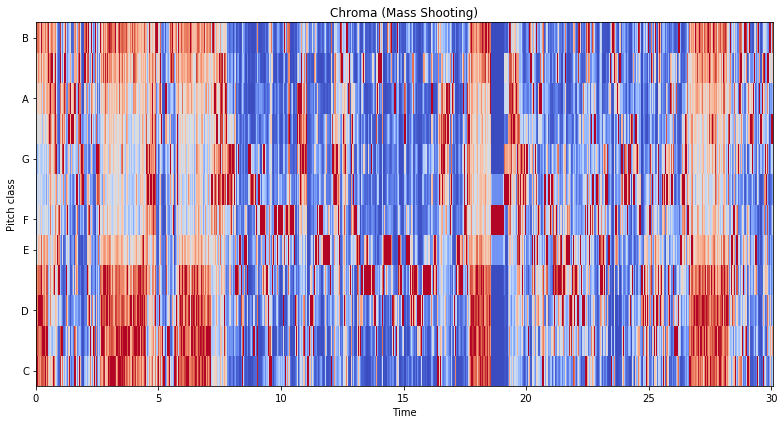

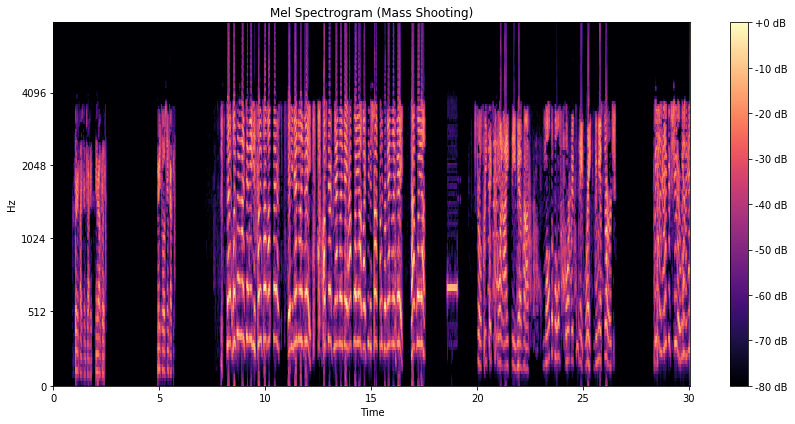

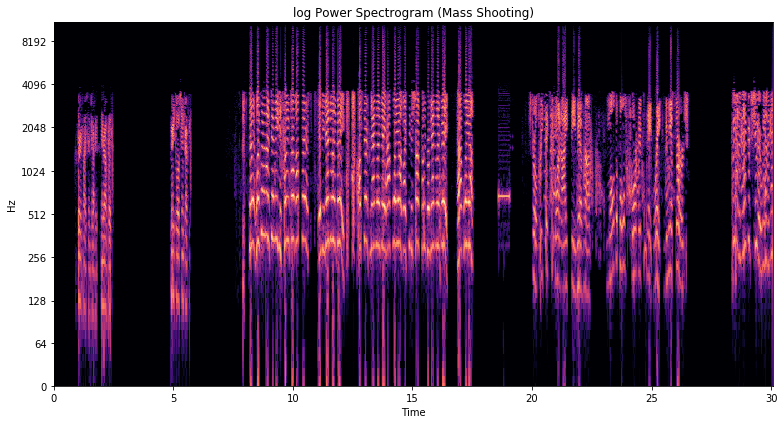

In [66]:
for i in range(len(raw_sounds)):
    plot_chroma(raw_sounds[i], labels[i])
    plot_melspect(raw_sounds[i], labels[i])
    plot_log_spect(raw_sounds[i], labels[i])

As seen in the plot above, we can visually see the difference between the Mass shooting plots and the non-emergencies. This provides evidence that the audio features provide a good classification parameter for our classes. In general terms, the mass shooting audio piece is more noisy and chaotic compared to the non emergency.

In the code below we display feature importances. We do this to hand pick some of them and then display scatter plots colored by class to highlight the classification properties of the audio features in our classes.

In [67]:
# Feature Importances
feature_importances = pd.DataFrame(rf.feature_importances_,
                                   columns=['Importance'],
                                   index=X_train.columns).sort_values(by='Importance', ascending=False)
feature_importances[:10]

,Importance
spectral_flat_1,0.092042
spectral_contrast_7,0.059144
contrast_7,0.045980
spectral_band_1,0.029203
mfcc_19,0.024996
mel_7,0.023013
chroma_cqt_8,0.020489
mfcc_20,0.018936
mfcc_18,0.017268
mel_117,0.015581


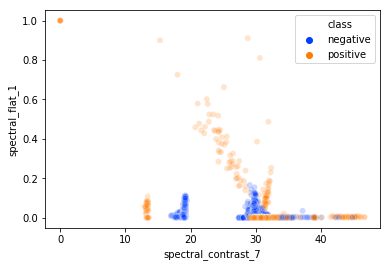

In [74]:
sns.scatterplot(df['spectral_contrast_7'], 
                df['spectral_flat_1'], 
                alpha = 0.2, 
                hue = df['class'], 
                palette = 'bright')

plt.savefig("eda1.svg", format="svg")

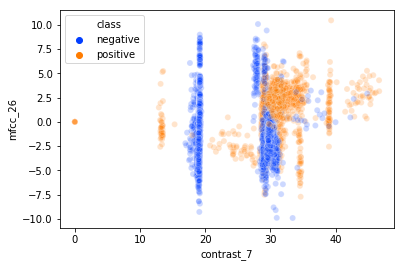

In [73]:
sns.scatterplot(df['contrast_7'], 
                df['mfcc_26'], 
                hue = df['class'], 
                alpha = 0.2, 
                palette = 'bright')

plt.savefig("eda2.svg", format="svg")

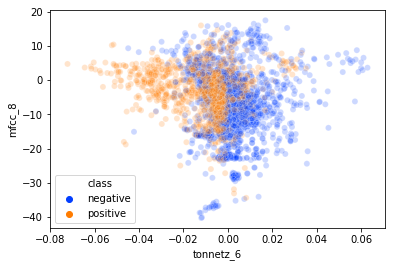

In [70]:
sns.scatterplot(df['tonnetz_6'], 
                df['mfcc_8'], 
                hue = df['class'], 
                alpha = 0.2, 
                palette = 'bright')

plt.savefig("eda3.svg", format="svg")

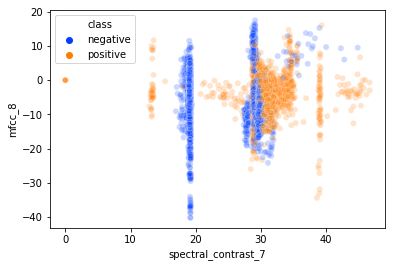

In [75]:
sns.scatterplot(df['spectral_contrast_7'], 
                df['mfcc_8'], 
                hue = df['class'], 
                alpha = 0.2, 
                palette = 'bright')

plt.savefig("eda4.svg", format="svg")

As seen above, even though there is some overlap in the scatterplots they are generally well divided between classes. This helps us provide evidence of the predictive power of these audio features in this particular classification problem. In addition to that, we believe that the combination of all features as predictors in our model provides a more robust classification power on a higer dimensional space. 